In [141]:
import requests
import json
import pandas as pd
import geopandas as gpd

import numpy as np

In [47]:
import contextily as cx

In [40]:
%matplotlib inline

In [42]:
import matplotlib.pyplot as plt

In [43]:
bbox_shapely = [
    [-122.4240775827961, 37.795],
    [-122.4240775827961, 37.810],
    [-122.41, 37.810],
    [-122.41, 37.795],
]

In [91]:
from shapely import geometry
from shapely.geometry import box

poly = geometry.Polygon(bbox_shapely)

In [72]:
ax = plt.subplots(figsize=(10,6), dpi=400)

<Figure size 4000x2400 with 0 Axes>

In [76]:
footprints = gpd.read_file("/home/thomas/Work/Research/uil/macro_energy/data/san-fransisco/prepped/footprints.geojson")

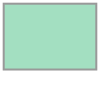

In [96]:
box(*footprints.geometry.unary_union.bounds)

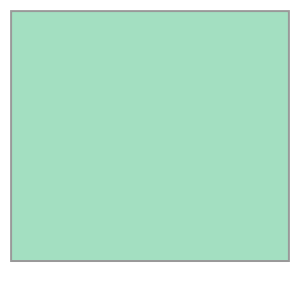

In [111]:
box(*bounding_gdf.bounds.iloc[0])

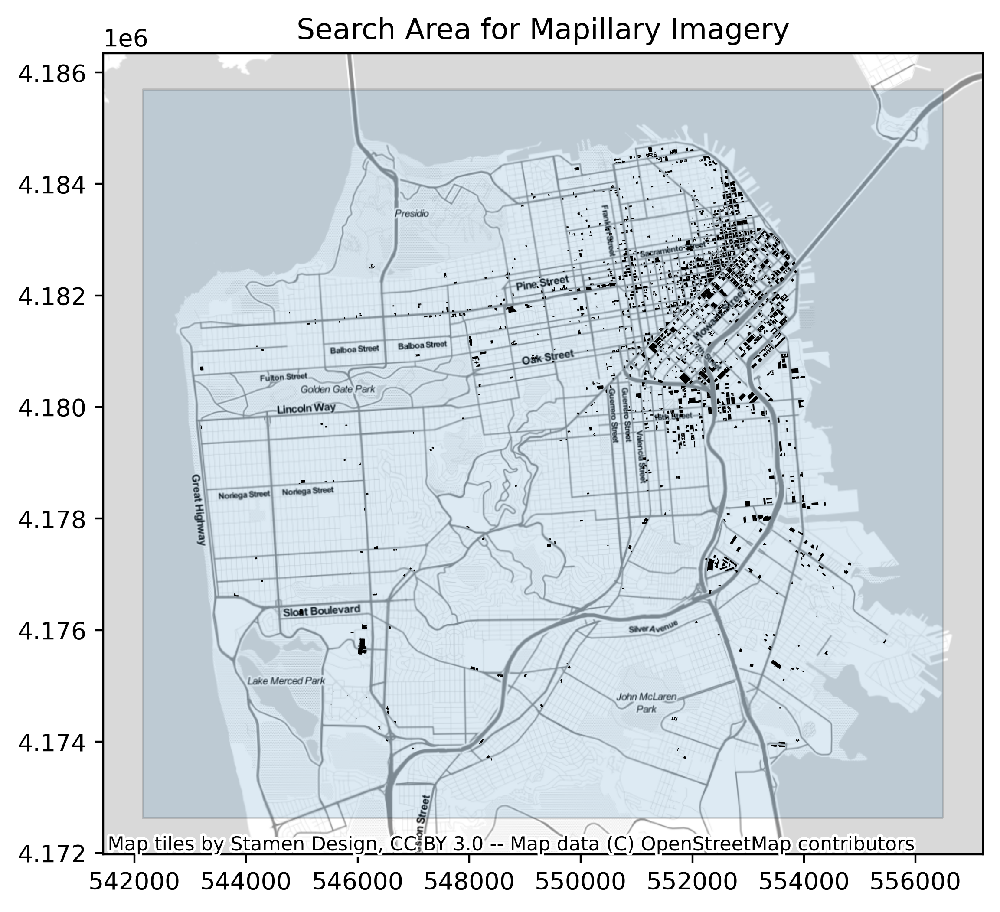

In [258]:
extra_perimeter = 1000

fig, ax = plt.subplots(figsize=(10,6), dpi=400)

poly = box(*footprints.geometry.unary_union.bounds)
bounding_gdf = gpd.GeoDataFrame(geometry = [poly], crs=4326).to_crs(32610).buffer(extra_perimeter)
# now I want to sharpen the edges

box_dimensions = bounding_gdf.bounds.iloc[0]
sharp_bounds = box(*box_dimensions)
bounding_gdf = gpd.GeoDataFrame(geometry = [sharp_bounds], crs=32610)

bounding_gdf.plot(
    ax = ax,
    alpha=0.15,
#     fillcolor=None,
    edgecolor='black',
)

footprints.to_crs(32610).plot(
    ax=ax,
    color="black"
)

cx.add_basemap(ax, crs= bounding_gdf.crs)

plt.title("Search Area for Mapillary Imagery")
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, crs= bounding_gdf.crs)
# cx.add_basemap(ax, source=cx.providers.Stamen.TonerLabels)

In [259]:
footprints.geometry.unary_union.bounds

(-122.50970893099998, 37.708900632, -122.37040971300002, 37.80790894900002)

In [260]:
import math
math.pow(1000, 0.5)

31.622776601683793

In [397]:
# want the cells to roughly be 2500m2
cell_size = math.pow(0.5e6, 0.5)

x_splits = np.arange(box_dimensions.minx, box_dimensions.maxx, cell_size)
y_splits = np.arange(box_dimensions.miny, box_dimensions.maxy, cell_size)

X = np.stack([
    x_splits[:-1], 
    x_splits[1:], 
]).T

Y = np.stack([
    y_splits[:-1], 
    y_splits[1:], 
]).T
# cell_boundaries = np.stack([
#     x_splits[:-1], 
#     y_splits[:-1],
#     x_splits[1:], 
#     y_splits[1:], 
# ]).T

xx, yy = np.meshgrid(x_splits, y_splits)

cell_list = []
for x in X:
    for y in Y:
#         print(x)
        cell_list.append(box(x[0], y[0], x[1], y[1]))

# cell_list = []
# for cell_boundary in cell_boundaries:
#     cell_list.append(box(*cell_boundary))

In [398]:
cells_gdf = gpd.GeoDataFrame(geometry = cell_list, crs=32610)

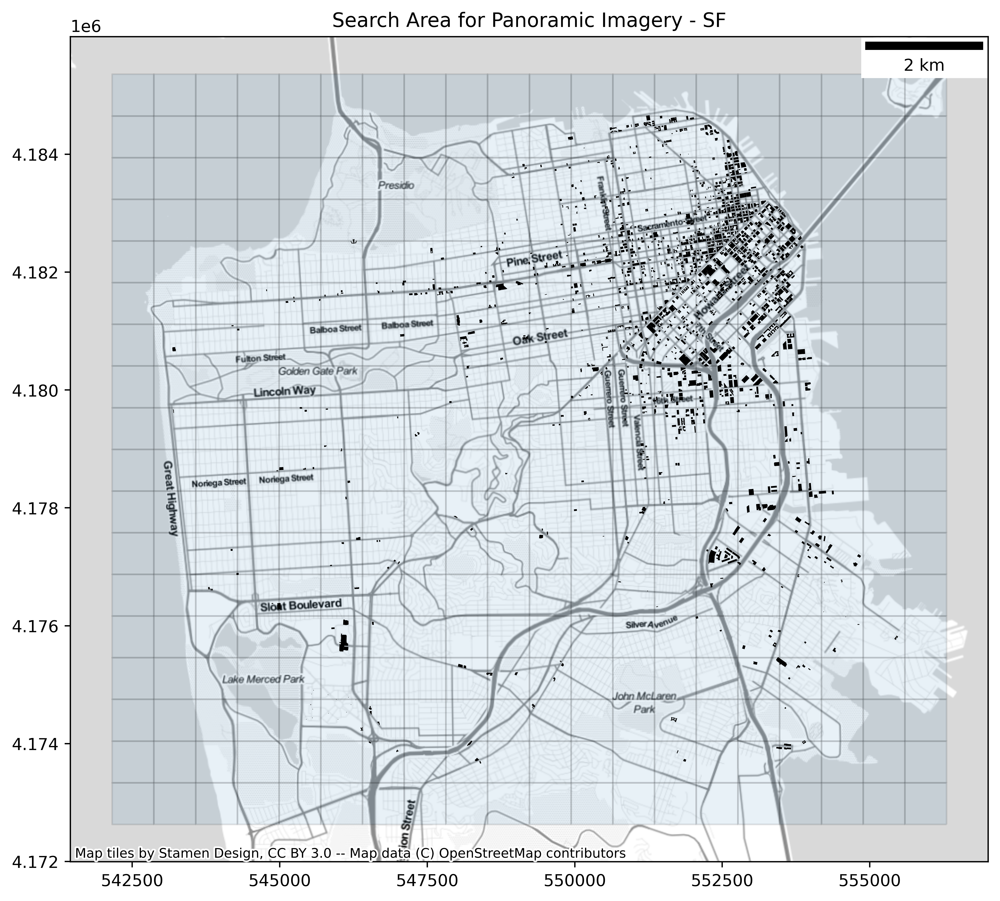

In [399]:
from matplotlib_scalebar.scalebar import ScaleBar

fig, ax = plt.subplots(figsize=(10,10), dpi=500)
plt.locator_params(axis='x', nbins=7)

cells_gdf.plot(
    ax = ax,
    alpha=0.1,
#     fillcolor=None,
    edgecolor='black',
)

footprints.to_crs(32610).plot(
    ax=ax,
    color="black"
)

ax.add_artist(ScaleBar(1))

cx.add_basemap(ax, crs= cells_gdf.crs)
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, crs= cells_gdf.crs)

plt.title("Search Area for Panoramic Imagery - SF")
plt.savefig("sf-boxregions.png")

plt.show()

In [417]:
len(cell_list)

360

In [403]:
cell_querystring = []

for cell in cells_gdf.to_crs(4326).geometry:
    cell_querystring.append(''.join(str(cell.bounds).strip('()').split(' ')))

In [404]:
city_path = "/home/thomas/Work/Research/uil/dbr/data/san-fransisco"

In [405]:
destination_dir = os.path.join(city_path, "panoimages/raw")

In [406]:
bbox = [
    -122.4240775827961,
    37.795,
    -122.41,
    37.810
]

In [407]:
bstring = (',').join([ str(x) for x in bbox ])

In [408]:
bstring = cell_querystring[268]
bstring

'-122.40866091101812,37.801355761856726,-122.40057759999213,37.8077693063469'

In [462]:
access_token = "MLYARA3RaccG5iuESo8ZCZA63Vc4CKJhLLAN5nrMo2Ukk9eI4D5ZChz0JaLgNlIIlQ5Ria79YZBqI6cJMaqSgUw5K9mkX1ZB4QZBJnkTXab27ZCN6jdFW15SnM3ifEfQyMCQZDZD"

In [463]:
import shapely

In [464]:
from tqdm import tqdm

In [ ]:
metadata = []

for cellquery in tqdm(cell_querystring):
    url = "https://graph.mapillary.com/images?access_token={}&bbox={}&fields=id,captured_at,mesh,thumb_original_url,compass_angle,exif_orientation,geometry,computed_geometry,computed_rotation,camera_type,camera_type=spherical".format(
        access_token, 
        cellquery
    )

    payload={}
    headers = {}

    response = requests.request("GET", url, headers=headers, data=payload).json()

    if 'data' in response:
        data_response = response['data']
        geodata = gpd.GeoDataFrame(data_response)
        if len(geodata) > 0:
            geodata.geometry = geodata.geometry.apply(lambda x: shapely.Point(x['coordinates']))
            geodata_fisheye = geodata.loc[geodata.camera_type.isin(["spherical","equirectangular"])]
            image_metadata = geodata_fisheye.drop(columns=["computed_geometry","computed_rotation","mesh"])
            metadata.append(image_metadata)
#     else:
#         print(f"No data found for: {cellquery}")

  8%|█████████▉                                                                                                                           | 27/360 [02:08<1:21:00, 14.60s/it]

No data found for: -122.51341001772008,37.750856023443376,-122.50534110846,37.75726255333097


  8%|██████████▌                                                                                                                            | 28/360 [02:09<57:20, 10.36s/it]

No data found for: -122.51336827706282,37.75722913507545,-122.50529866596774,37.763635665643726


  8%|██████████▉                                                                                                                            | 29/360 [02:09<40:51,  7.40s/it]

No data found for: -122.51332652324716,37.76360223975744,-122.5052562100956,37.77000877100729


  8%|███████████▎                                                                                                                           | 30/360 [02:10<29:18,  5.33s/it]

No data found for: -122.51328475626867,37.76997533748893,-122.50521374083904,37.77638186942124


  9%|███████████▋                                                                                                                           | 31/360 [02:13<25:41,  4.69s/it]

No data found for: -122.51324297612295,37.776348428269536,-122.50517125819358,37.7827549608852


  9%|████████████                                                                                                                           | 32/360 [02:18<26:28,  4.84s/it]

No data found for: -122.51320118280559,37.78272151209885,-122.5051287621548,37.789128045398755


 11%|██████████████▎                                                                                                                        | 38/360 [02:49<39:00,  7.27s/it]

No data found for: -122.5056801672585,37.706210144495124,-122.49761549104953,37.71261720772178


 11%|██████████████▋                                                                                                                        | 39/360 [02:54<35:36,  6.66s/it]

No data found for: -122.5056378316444,37.712583297021354,-122.49757245493676,37.71899036104587


 12%|███████████████▌                                                                                                                     | 42/360 [03:51<1:09:09, 13.05s/it]

No data found for: -122.50551074471952,37.73170271290703,-122.49744326518926,37.73810977933059


 12%|████████████████▏                                                                                                                      | 43/360 [03:57<56:31, 10.70s/it]

No data found for: -122.50546835570212,37.738075837636586,-122.49740017478857,37.74448290486162


 12%|████████████████▌                                                                                                                      | 44/360 [03:58<41:01,  7.79s/it]

No data found for: -122.5054259533227,37.744448955415955,-122.49735707080454,37.750856023443376


 12%|████████████████▉                                                                                                                      | 45/360 [04:03<37:09,  7.08s/it]

No data found for: -122.50538353757685,37.75082206624472,-122.49731395323262,37.75722913507545


 13%|█████████████████▎                                                                                                                     | 46/360 [04:08<34:27,  6.58s/it]

No data found for: -122.50534110846,37.75719517012251,-122.49727082206826,37.76360223975744


 13%|█████████████████▋                                                                                                                     | 47/360 [04:09<25:06,  4.81s/it]

No data found for: -122.50529866596774,37.76356826704889,-122.4972276773069,37.76997533748893


 13%|██████████████████                                                                                                                     | 48/360 [04:15<26:01,  5.01s/it]

No data found for: -122.5052562100956,37.76994135702348,-122.49718451894398,37.776348428269536


 14%|██████████████████▍                                                                                                                    | 49/360 [04:17<22:27,  4.33s/it]

No data found for: -122.50521374083904,37.77631444004586,-122.49714134697498,37.78272151209885


 15%|████████████████████▋                                                                                                                  | 55/360 [04:39<15:16,  3.01s/it]

No data found for: -122.49770152259768,37.69980254423716,-122.4896368735009,37.706210144495124


 16%|██████████████████████▏                                                                                                                | 59/360 [04:46<11:09,  2.22s/it]

No data found for: -122.49752940525882,37.72529510896233,-122.48946195287705,37.73170271290703


 17%|██████████████████████▌                                                                                                                | 60/360 [04:52<15:36,  3.12s/it]

No data found for: -122.49748634201117,37.73166823276788,-122.4894181882552,37.738075837636586


 17%|██████████████████████▉                                                                                                                | 61/360 [04:52<11:41,  2.35s/it]

No data found for: -122.49744326518926,37.738041349622314,-122.48937440983778,37.744448955415955


 17%|███████████████████████▎                                                                                                               | 62/360 [04:53<08:52,  1.79s/it]

No data found for: -122.49740017478857,37.74441445952526,-122.48933061762011,37.75082206624472


 18%|███████████████████████▋                                                                                                               | 63/360 [04:53<06:55,  1.40s/it]

No data found for: -122.49735707080454,37.750787562476276,-122.48928681159765,37.75719517012251


 18%|████████████████████████                                                                                                               | 64/360 [04:54<05:36,  1.14s/it]

No data found for: -122.49731395323262,37.75716065847496,-122.48924299176575,37.76356826704889


 18%|████████████████████████▍                                                                                                              | 65/360 [04:54<04:38,  1.06it/s]

No data found for: -122.49727082206826,37.763533747520924,-122.48919915811975,37.76994135702348


 18%|████████████████████████▊                                                                                                              | 66/360 [04:55<03:56,  1.24it/s]

No data found for: -122.4972276773069,37.76990682961375,-122.48915531065504,37.77631444004586


 19%|█████████████████████████▏                                                                                                             | 67/360 [04:55<03:29,  1.40it/s]

No data found for: -122.49718451894398,37.776279904753046,-122.48911144936702,37.782687516115644


 19%|█████████████████████████▌                                                                                                             | 68/360 [04:56<03:09,  1.54it/s]

No data found for: -122.49714134697498,37.7826529729384,-122.48906757425102,37.78906058523241


 19%|█████████████████████████▉                                                                                                             | 69/360 [04:56<03:01,  1.61it/s]

No data found for: -122.4970981613953,37.78902603416941,-122.48902368530243,37.79543364739577


 19%|██████████████████████████▎                                                                                                            | 70/360 [04:57<02:49,  1.71it/s]

No data found for: -122.49705496220041,37.795399088445684,-122.4889797825166,37.801806702605326


 20%|██████████████████████████▋                                                                                                            | 71/360 [04:57<02:41,  1.79it/s]

No data found for: -122.4970117493857,37.80177213576681,-122.48893586588889,37.80817975086065


 20%|███████████████████████████                                                                                                            | 72/360 [04:58<02:35,  1.85it/s]

No data found for: -122.49696852294666,37.80814517613237,-122.48889193541464,37.81455279216137


 20%|███████████████████████████▍                                                                                                           | 73/360 [04:58<02:32,  1.89it/s]

No data found for: -122.48968056921399,37.69976755788432,-122.48161524717267,37.70617569584307


 21%|███████████████████████████▊                                                                                                           | 74/360 [04:59<02:28,  1.93it/s]

No data found for: -122.4896368735009,37.70614070149714,-122.48157085075812,37.712548840499515


 21%|████████████████████████████▏                                                                                                          | 75/360 [04:59<02:26,  1.95it/s]

No data found for: -122.48959316401526,37.71251383815914,-122.48152644034992,37.71892197820607


 21%|████████████████████████████▌                                                                                                          | 76/360 [05:00<02:23,  1.97it/s]

No data found for: -122.48954944075247,37.71888696786991,-122.48148201594343,37.72529510896233


 21%|████████████████████████████▉                                                                                                          | 77/360 [05:00<02:22,  1.99it/s]

No data found for: -122.48950570370795,37.72526009062902,-122.48143757753394,37.73166823276788


 22%|█████████████████████████████▎                                                                                                         | 78/360 [05:01<02:19,  2.02it/s]

No data found for: -122.48946195287705,37.731633206436086,-122.48139312511674,37.738041349622314


 22%|█████████████████████████████▋                                                                                                         | 79/360 [05:01<02:24,  1.95it/s]

No data found for: -122.4894181882552,37.738006315290676,-122.48134865868718,37.74441445952526


 22%|██████████████████████████████                                                                                                         | 80/360 [05:02<02:21,  1.99it/s]

No data found for: -122.48937440983778,37.744379417192434,-122.48130417824055,37.750787562476276


 22%|██████████████████████████████▍                                                                                                        | 81/360 [05:02<02:21,  1.97it/s]

No data found for: -122.48933061762011,37.750752512140906,-122.48125968377217,37.75716065847496


 23%|██████████████████████████████▊                                                                                                        | 82/360 [05:03<02:18,  2.00it/s]

No data found for: -122.48928681159765,37.757125600135694,-122.4812151752773,37.763533747520924


 23%|███████████████████████████████▏                                                                                                       | 83/360 [05:03<02:17,  2.02it/s]

No data found for: -122.48924299176575,37.76349868117641,-122.4811706527513,37.76990682961375


 23%|███████████████████████████████▌                                                                                                       | 84/360 [05:08<08:48,  1.91s/it]

No data found for: -122.48919915811975,37.769871755262635,-122.48112611618944,37.776279904753046


 24%|███████████████████████████████▉                                                                                                       | 85/360 [05:09<06:48,  1.49s/it]

No data found for: -122.48915531065504,37.77624482239397,-122.48108156558703,37.7826529729384


 24%|████████████████████████████████▎                                                                                                      | 86/360 [05:09<05:25,  1.19s/it]

No data found for: -122.48911144936702,37.782617882570015,-122.48103700093935,37.78902603416941


 24%|████████████████████████████████▋                                                                                                      | 87/360 [05:11<05:21,  1.18s/it]

No data found for: -122.48906757425102,37.78899093579035,-122.48099242224168,37.795399088445684


 24%|█████████████████████████████████                                                                                                      | 88/360 [05:11<04:25,  1.02it/s]

No data found for: -122.48902368530243,37.79536398205462,-122.48094782948937,37.80177213576681


 25%|██████████████████████████████████▏                                                                                                    | 91/360 [05:18<09:39,  2.15s/it]

No data found for: -122.48165962959827,37.699732025965126,-122.47359363483339,37.70614070149714


 26%|███████████████████████████████████▎                                                                                                   | 94/360 [06:08<46:02, 10.39s/it]

No data found for: -122.48152644034992,37.718851411593434,-122.47345834218193,37.72526009062902


 26%|███████████████████████████████████▋                                                                                                   | 95/360 [06:13<39:02,  8.84s/it]

No data found for: -122.48148201594343,37.725224526230704,-122.47341321619848,37.731633206436086


 27%|████████████████████████████████████                                                                                                   | 96/360 [06:13<27:43,  6.30s/it]

No data found for: -122.48143757753394,37.73159763391457,-122.47336807599065,37.738006315290676


 27%|████████████████████████████████████▍                                                                                                  | 97/360 [06:14<19:49,  4.52s/it]

No data found for: -122.48139312511674,37.737970734644584,-122.47332292155366,37.744379417192434


 27%|████████████████████████████████████▊                                                                                                  | 98/360 [06:14<14:22,  3.29s/it]

No data found for: -122.48134865868718,37.74434382842038,-122.47327775288274,37.750752512140906


 28%|█████████████████████████████████████▏                                                                                                 | 99/360 [06:14<10:20,  2.38s/it]

No data found for: -122.48130417824055,37.750716915241526,-122.4732325699731,37.757125600135694


 28%|█████████████████████████████████████▏                                                                                                | 100/360 [06:15<07:30,  1.73s/it]

No data found for: -122.48125968377217,37.75708999510762,-122.47318737282004,37.76349868117641


 28%|█████████████████████████████████████▌                                                                                                | 101/360 [06:15<05:36,  1.30s/it]

No data found for: -122.4812151752773,37.763463068018254,-122.47314216141872,37.769871755262635


 28%|█████████████████████████████████████▉                                                                                                | 102/360 [06:15<04:35,  1.07s/it]

No data found for: -122.4811706527513,37.76983613397304,-122.47309693576439,37.77624482239397


 29%|██████████████████████████████████████▎                                                                                               | 103/360 [06:16<03:33,  1.20it/s]

No data found for: -122.48112611618944,37.77620919297155,-122.4730516958523,37.782617882570015


 29%|██████████████████████████████████████▋                                                                                               | 104/360 [06:16<03:05,  1.38it/s]

No data found for: -122.48108156558703,37.782582245013394,-122.47300644167764,37.78899093579035


 29%|███████████████████████████████████████                                                                                               | 105/360 [06:16<02:37,  1.62it/s]

No data found for: -122.48103700093935,37.78895529009817,-122.47296117323565,37.79536398205462


 29%|███████████████████████████████████████▍                                                                                              | 106/360 [06:17<02:23,  1.77it/s]

No data found for: -122.48099242224168,37.795328328225466,-122.4729158905215,37.80173702136235


 30%|███████████████████████████████████████▊                                                                                              | 107/360 [06:18<02:33,  1.65it/s]

No data found for: -122.48094782948937,37.801701359394876,-122.47287059353047,37.808110053713186


 30%|████████████████████████████████████████▏                                                                                             | 108/360 [06:18<02:24,  1.75it/s]

No data found for: -122.48090322267763,37.808074383606,-122.47282528225776,37.81448307910671


 30%|████████████████████████████████████████▌                                                                                             | 109/360 [06:19<02:17,  1.82it/s]

No data found for: -122.4736387039668,37.69969594848256,-122.46557203669951,37.70610516146023


 31%|████████████████████████████████████████▉                                                                                             | 110/360 [06:19<01:57,  2.12it/s]

No data found for: -122.47359363483339,37.70606907573529,-122.46552626644126,37.71247829000313


 31%|█████████████████████████████████████████▎                                                                                            | 111/360 [06:19<01:38,  2.52it/s]

No data found for: -122.47354855149462,37.712442196034445,-122.46548048175639,37.718851411593434


 31%|█████████████████████████████████████████▋                                                                                            | 112/360 [06:19<01:25,  2.90it/s]

No data found for: -122.47350345394571,37.71881530937961,-122.46543468264007,37.725224526230704


 31%|██████████████████████████████████████████                                                                                            | 113/360 [06:20<01:27,  2.82it/s]

No data found for: -122.47345834218193,37.72518841577035,-122.46538886908745,37.73159763391457


 32%|██████████████████████████████████████████▍                                                                                           | 114/360 [06:20<01:17,  3.18it/s]

No data found for: -122.47341321619848,37.73156151520627,-122.46534304109373,37.737970734644584


 32%|██████████████████████████████████████████▊                                                                                           | 115/360 [06:20<01:09,  3.50it/s]

No data found for: -122.47336807599065,37.73793460768699,-122.46529719865406,37.74434382842038


 32%|███████████████████████████████████████████▌                                                                                          | 117/360 [06:21<00:58,  4.13it/s]

No data found for: -122.47332292155366,37.74430769321206,-122.46525134176359,37.750716915241526
No data found for: -122.47327775288274,37.7506807717811,-122.46520547041752,37.75708999510762


 33%|███████████████████████████████████████████▉                                                                                          | 118/360 [06:21<00:52,  4.63it/s]

No data found for: -122.4732325699731,37.7570538433937,-122.46515958461097,37.763463068018254


 33%|████████████████████████████████████████████▎                                                                                         | 119/360 [06:21<00:55,  4.37it/s]

No data found for: -122.47318737282004,37.76342690804943,-122.46511368433912,37.76983613397304


 33%|████████████████████████████████████████████▋                                                                                         | 120/360 [06:21<01:03,  3.76it/s]

No data found for: -122.47314216141872,37.76979996574792,-122.46506776959711,37.77620919297155


 34%|█████████████████████████████████████████████▍                                                                                        | 122/360 [06:22<01:00,  3.94it/s]

No data found for: -122.47309693576439,37.77617301648875,-122.46502184038012,37.782582245013394
No data found for: -122.4730516958523,37.782546060271514,-122.46497589668327,37.78895529009817


 34%|██████████████████████████████████████████████▏                                                                                       | 124/360 [06:22<00:54,  4.35it/s]

No data found for: -122.47300644167764,37.7889190970958,-122.4649299385017,37.795328328225466
No data found for: -122.47296117323565,37.795292126961215,-122.46488396583058,37.801701359394876


 35%|██████████████████████████████████████████████▉                                                                                       | 126/360 [06:23<00:51,  4.53it/s]

No data found for: -122.4729158905215,37.801665149867354,-122.46483797866503,37.808074383606
No data found for: -122.47287059353047,37.8080381658138,-122.46479197700022,37.814447400858434


 35%|███████████████████████████████████████████████▎                                                                                      | 127/360 [06:23<00:53,  4.39it/s]

No data found for: -122.46561779253595,37.69965932543958,-122.45755045298742,37.70606907573529


 36%|███████████████████████████████████████████████▋                                                                                      | 128/360 [06:23<00:53,  4.36it/s]

No data found for: -122.46557203669951,37.70603244432533,-122.45750399581453,37.712442196034445


 36%|████████████████████████████████████████████████                                                                                      | 129/360 [06:23<00:58,  3.96it/s]

No data found for: -122.46552626644126,37.71240555625608,-122.45745752399851,37.71881530937961


 36%|████████████████████████████████████████████████▍                                                                                     | 130/360 [06:24<01:05,  3.52it/s]

No data found for: -122.46548048175639,37.71877866123142,-122.45741103753447,37.72518841577035


 36%|████████████████████████████████████████████████▊                                                                                     | 131/360 [06:24<01:04,  3.54it/s]

No data found for: -122.46543468264007,37.72515175925094,-122.45736453641751,37.73156151520627


 37%|█████████████████████████████████████████████████▏                                                                                    | 132/360 [06:24<00:59,  3.82it/s]

No data found for: -122.46538886908745,37.73152485031422,-122.45731802064273,37.73793460768699


In [461]:
response.json()

{'error': {'message': 'Timeout',
  'type': 'OAuthException',
  'code': -2,
  'error_subcode': 3404014,
  'is_transient': False,
  'error_user_title': 'Query Timeout',
  'error_user_msg': 'The query timed out, please retry the query',
  'fbtrace_id': 'AQZFSjDg7b-l4gZVltrabgG'}}

In [451]:
full_metadata = pd.concat(metadata, ignore_index=True).set_crs(4326)

In [452]:
full_metadata.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [454]:
full_metadata.to_file(os.path.join(city_path, "pano_metadata.geojson"))

In [455]:
image_counts = [ len(x) for x in metadata ]
image_counts_norm = [ plt.cm.jet(x / max(image_counts)) for x in image_counts ]

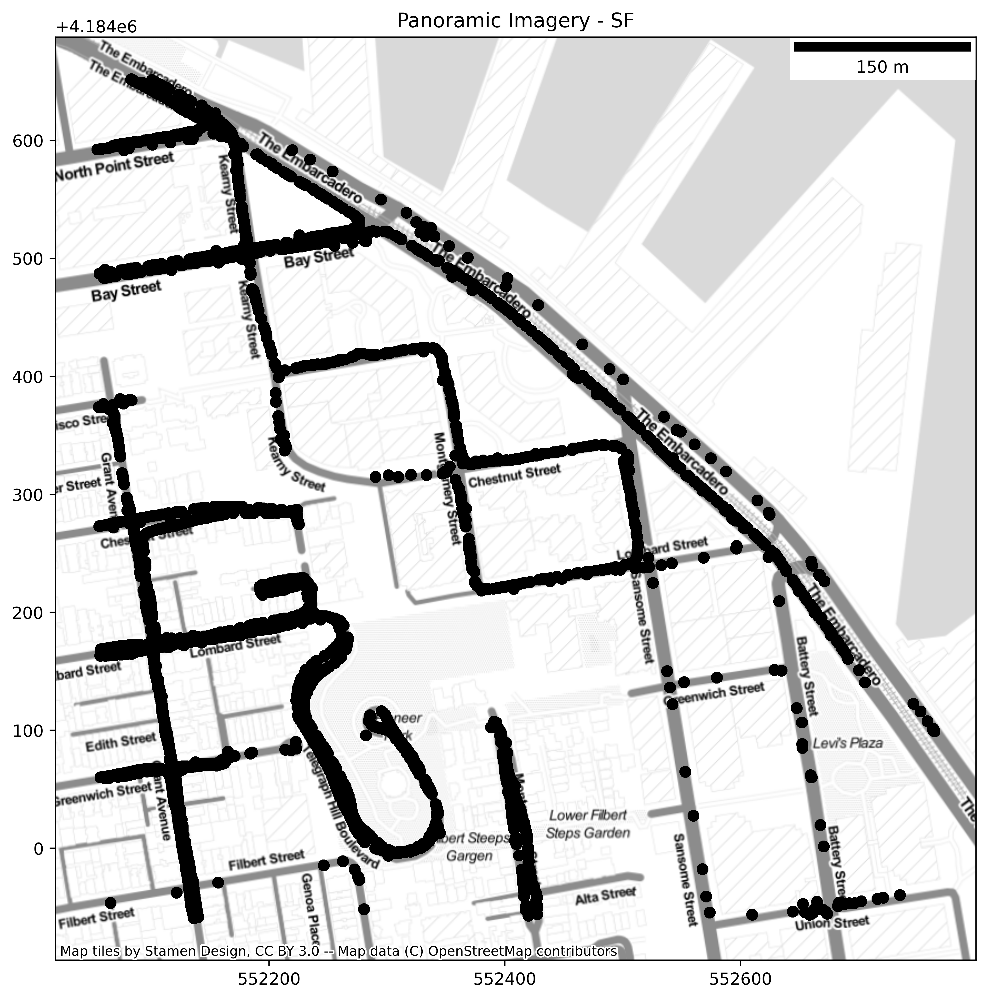

In [456]:
from matplotlib_scalebar.scalebar import ScaleBar

fig, ax = plt.subplots(figsize=(10,10), dpi=500)
plt.locator_params(axis='x', nbins=7)

full_metadata_meters = full_metadata.to_crs(32610)
full_metadata_meters.plot(
    ax=ax,
    color="black"
)

ax.add_artist(ScaleBar(1))

cx.add_basemap(ax, crs= full_metadata_meters.crs)
cx.add_basemap(ax, source=cx.providers.Stamen.TonerLite, crs= full_metadata_meters.crs)

plt.title("Panoramic Imagery - SF")
plt.savefig("sf-panos.png")

plt.show()

<AxesSubplot: >

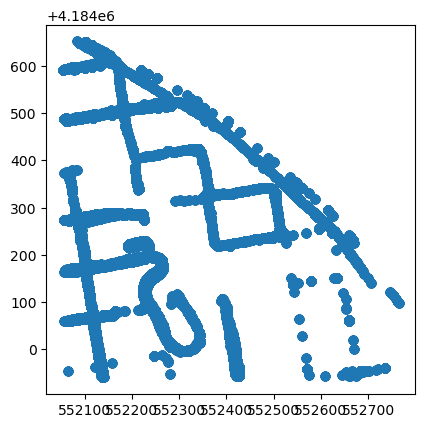

In [457]:
full_metadata_meters.plot()

In [353]:
full_metadata.to_file(os.path.join(city_path, "pano_metadata.geojson"))

/home/thomas/miniconda3/envs/dbr/lib/python3.9/site-packages/geopandas/io/file.py:545: UserWarning: You are attempting to write an empty DataFrame to file. For some drivers, this operation may fail.
  _to_file_fiona(df, filename, driver, schema, crs, mode, **kwargs)


In [354]:
geodata

,id,captured_at,mesh,thumb_original_url,compass_angle,exif_orientation,geometry,computed_geometry,computed_rotation,camera_type
0,1247193909031307,1532007555285,"{'id': '531163234587944', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,275.366943,1,POINT (-122.50517 37.78138),"{'type': 'Point', 'coordinates': [-122.5051539...","[1.0989200238683, 1.0843873819972, -1.25763918...",perspective
1,1800401703456522,1473760674000,"{'id': '207903677807552', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,88.305981,1,POINT (-122.50566 37.77194),"{'type': 'Point', 'coordinates': [-122.5056650...","[1.1409892904709, -1.2661110661462, 1.17266071...",perspective
2,1966197346869456,1531785057326,"{'id': '998118000995680', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,68.288696,1,POINT (-122.51080 37.77971),"{'type': 'Point', 'coordinates': [-122.5107774...","[1.2945182921244, -0.98135608195814, 0.9848349...",perspective
3,3032301166991730,1533138509599,"{'id': '602994364008551', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,356.711090,1,POINT (-122.50352 37.77239),"{'type': 'Point', 'coordinates': [-122.5035346...","[1.3832272073219, 0.083769811291509, -0.105593...",perspective
4,3313867645539246,1534727904015,"{'id': '3138638409718235', 'url': 'https://sco...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,266.427094,1,POINT (-122.51300 37.77907),NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1995,1286037898458778,1532045669386,"{'id': '936219790505556', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,92.714943,1,POINT (-122.50550 37.78210),"{'type': 'Point', 'coordinates': [-122.5054961...","[1.0674220054953, -1.1925150039096, 1.31599949...",perspective
1996,2169746719991568,1534727826645,"{'id': '576619847060219', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,276.869781,1,POINT (-122.50414 37.77973),NaN,NaN,NaN
1997,1519897965047492,1534254879233,"{'id': '292261512607962', 'url': 'https://scon...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,323.391205,1,POINT (-122.51179 37.77662),"{'type': 'Point', 'coordinates': [-122.5117250...","[1.4034111895783, 0.50958122155343, -0.6313203...",perspective
1998,2991234297774344,1535724796064,"{'id': '2900415226867257', 'url': 'https://sco...",https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/A...,285.074615,1,POINT (-122.50701 37.78160),"{'type': 'Point', 'coordinates': [-122.5070238...","[1.227746848998, 0.99937880052809, -1.06521048...",perspective


In [357]:
image_url = geodata.iloc[0].thumb_original_url
image_url

'https://scontent-sjc3-1.xx.fbcdn.net/m1/v/t6/An9ajcBwarVHat7Hbp2Rl0p4exXonzGlEnYGXPcWaFL6KShrbc_kjr3R7E6VPOuM3Jf2THop_bHrjywjMIytpKtMExZ5e-722rH6K-0Y_llJz9jWIrg5vASwmbLWzso4cCEKXaGaz2z7xWShkqAUIQ?ccb=10-5&oh=00_AfDEKFt3PGGvyNE_Y8QxRyxihWM4p5ihy8J2eXgq4uXZQg&oe=642774BF&_nc_sid=122ab1'

In [309]:
image_metadata.iloc[0].id

'1223320758520956'

In [ ]:
os.path.isfile(im)

In [316]:
import os

image_id = image_metadata.iloc[0].id
for image_metadataterm in image_metadata:
    image_id = image_metadataterm.id
    image_url = image_metadataterm.thumb_original_url
    
    image_path = os.path.join(destination_dir, image_id + ".png")
    if not os.path.isfile(image_path):
        img_data = requests.get(image_url).content
        with open(image_path, 'wb') as handler:
            handler.write(img_data)
    else:
        print(f"Found image: {image_id[:5]}")

Found image: 12233


In [11]:
geodata_fisheye.__len__()

1781

In [25]:
image_metadata.explore(
    popup=True,  # show all values in popup (on click)
    tiles="CartoDB positron",  # use "CartoDB positron" tiles
    cmap="Set1",  # use "Set1" matplotlib colormap
    style_kwds=dict(color="black"),  # use black outline
)

In [14]:
geodata_fisheye.geometry.explore()

<Figure size 1500x1500 with 0 Axes>

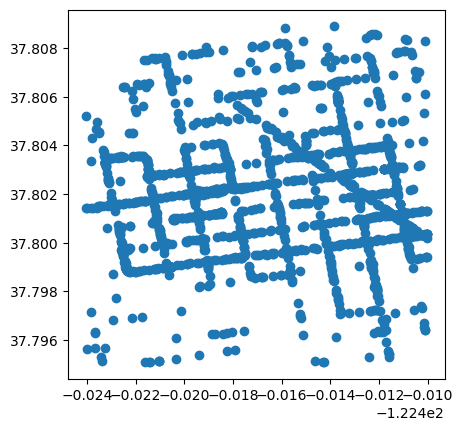

In [14]:
plt.figure(figsize=(15,15))
geodata_fisheye.geometry.plot()
plt.show()

In [15]:
geodata.geometry.apply(lambda x: shapely.Point(x['coordinates']))

TypeError: 'Point' object is not subscriptable

In [ ]:
shapely.Point(geodata.geometry[0]['coordinates'])